This goes through the general pipeline to analyze the ATP calibrations for ATEAM.

Here I am using AT1.03 full-field with motors

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
# Numpy imports:
import numpy as np

#Scipy imports
import scipy
from scipy import optimize
from scipy.optimize import curve_fit

# for extracting filenames
import glob

# skimage submodules we need
import skimage.io
import skimage.measure
import skimage.filters
import skimage.exposure
import skimage.morphology
from skimage.registration import phase_cross_correlation

#For identifying aster center
from skimage.filters import threshold_otsu, gaussian
from skimage.measure import regionprops
import cv2

#Matplotlib imports
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# # Seaborn imports (stylistic for nice plots)
# import seaborn as sns
# rc={'lines.linewidth': 2, 'axes.labelsize': 14, 'axes.titlesize': 14, \
#     'xtick.labelsize' : 14, 'ytick.labelsize' : 14}
# sns.set(style='ticks', rc=rc)

#for DataFrames
import pandas as pd

#To interact with the operating system
import os

#For status bar 
from tqdm.notebook import tqdm as tqdm

In [2]:
import atp_cal

In [4]:
atp_cal.pboc_style_mpl()

# show images in viridis by default (pboc is fire?)
plt.rcParams['image.cmap'] = 'viridis'

In [28]:
#!/usr/bin/env python
# coding: utf-8

# In[ ]:

# Figure Formatting
import matplotlib.pyplot as plt
import matplotlib as mpl

figwidth = 8
plt.rcParams["figure.figsize"] = [figwidth, figwidth * 1105 / 1920
                                  ]  # figure size in inches
plt.rcParams["lines.linewidth"] = 2  # line width in points
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"

plt.rcParams["font.style"] = "normal"
plt.rcParams["font.weight"] = "heavy"
plt.rcParams["font.size"] = 13.0
plt.rcParams["axes.labelweight"] = "bold"  # weight of the x and y labels
plt.rcParams["axes.spines.right"] = True
plt.rcParams[
    "axes.formatter.useoffset"] = True  # If True, the tick label formatter
plt.rcParams["xtick.major.size"] = 10  # major tick size in points
plt.rcParams["xtick.minor.size"] = 4  # minor tick size in points
plt.rcParams["xtick.direction"] = "in"  # direction in, out, or inout
plt.rcParams["xtick.minor.visible"] = True
plt.rcParams["ytick.major.size"] = 10  # major tick size in points
plt.rcParams["ytick.minor.size"] = 4  # minor tick size in points
plt.rcParams["ytick.direction"] = "in"  # direction in, out, or inout
plt.rcParams["ytick.minor.visible"] = True
plt.rcParams["legend.fontsize"] = 10
plt.rcParams[
    "legend.labelspacing"] = 0.1  # the vertical space between the legend entries in fraction of fontsize
plt.rcParams["legend.shadow"] = False
plt.rcParams[
    "legend.frameon"] = True  # whether or not to draw a frame around legend
plt.rcParams[
    'axes.unicode_minus'] = False  # fix glyph error by using normal hyphens
mpl.rc("figure", dpi=200)

## Settings and Functions

#### Image Plotting Settings

In this cell I specify the size of images and the conversion of pixels to µm. As well as, some settings for plotting in holoviews

In [3]:
# Length calibration [microns per pixel]
um_per_pixel = 0.29

# Image dimensions
w_px, h_px = 1920, 1200
w_um, h_um = w_px*um_per_pixel, h_px*um_per_pixel

#bounds
bounds = [0, 0, w_um, h_um]

#Set the frame size of the image to enforce square pixels (holoviews does not have this preset)
frame_height = 200
frame_width = w_px * frame_height // h_px

#Preset these settings as opts
opts = dict(
    frame_height=frame_height,
    frame_width=frame_width,
    xlabel="µm",
    ylabel="µm",
    cmap = 'viridis'
)

#### Parameters:
Here list ATP concentration

In [4]:
ATPconc = np.array([1410, 705, 352, 176, 88, 0])

## Import Images

In [5]:
#This should not change between experiments:
datapath = '../../../../data/atp_cal'

#This varies between experiments. Here I use the calibration from 5/23/22. 
datafolder = '2022-06-29_ATeam_Cal/2022-06-29_ATeam_Cal_1/images'

# YFP Images
included_YFP = '*C1*.tif'
YFP_files = np.sort(glob.glob(datapath+'/'+datafolder+'/'+included_YFP))

# CFP Images
included_CFP = '*C2*.tif'
CFP_files = np.sort(glob.glob(datapath+'/'+datafolder+'/'+included_CFP))

# Motor Images
included_Mot = '*C3*.tif'
Mot_files = np.sort(glob.glob(datapath+'/'+datafolder+'/'+included_Mot))

#The ensure images are in order, sort them:
YFP_files_ordered = atp_cal.file_sorter(YFP_files)
CFP_files_ordered = atp_cal.file_sorter(CFP_files)
Mot_files_ordered = atp_cal.file_sorter(Mot_files)

#Read in images and save as array:
YFP_array = atp_cal.file_to_image(YFP_files_ordered)
CFP_array = atp_cal.file_to_image(CFP_files_ordered)
Mot_array = atp_cal.file_to_image(Mot_files_ordered)

# Define the zero concentration image (DO EVERY TIME):
YFP_zero = YFP_array[0] #[-2]
CFP_zero = CFP_array[0] #[-2]
Mot_zero = Mot_array[0] #[-2]

# ------------------------------------------------------------------------------ #

#Import Background images
bgfolder = '2022-06-29_ATeam_Cal/2022-06-29_ATeam_Cal_1/images'

bgYFP_name = 'C1-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'
bgCFP_name = 'C2-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'
bgMot_name = 'C3-2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome'

#2022-06-29_ATeam_Cal_1_MMStack_Pos6.ome0000

#YFP_bg = atp_cal.file_to_image(np.sort(glob.glob(datapath+'/'+bgfolder+'/'+bgYFP_name)))
YFP_bg = skimage.io.imread(datapath+'/'+bgfolder+'/'+bgYFP_name+'.tif')
CFP_bg = skimage.io.imread(datapath+'/'+bgfolder+'/'+bgCFP_name+'.tif')
Mot_bg = skimage.io.imread(datapath+'/'+bgfolder+'/'+bgMot_name+'.tif')

# # Define an average offset
# YFP_bg_offset = np.average(YFP_bg)
# CFP_bg_offset = np.average(CFP_bg)
# Mot_bg_offset = np.average(Mot_bg)

In [6]:
#delete the 7th image that is 0uM ATP with no ATeam (this is the bg images imported above)
YFP_array = YFP_array[:-1]
CFP_array = CFP_array[:-1]
Mot_array = Mot_array[:-1]

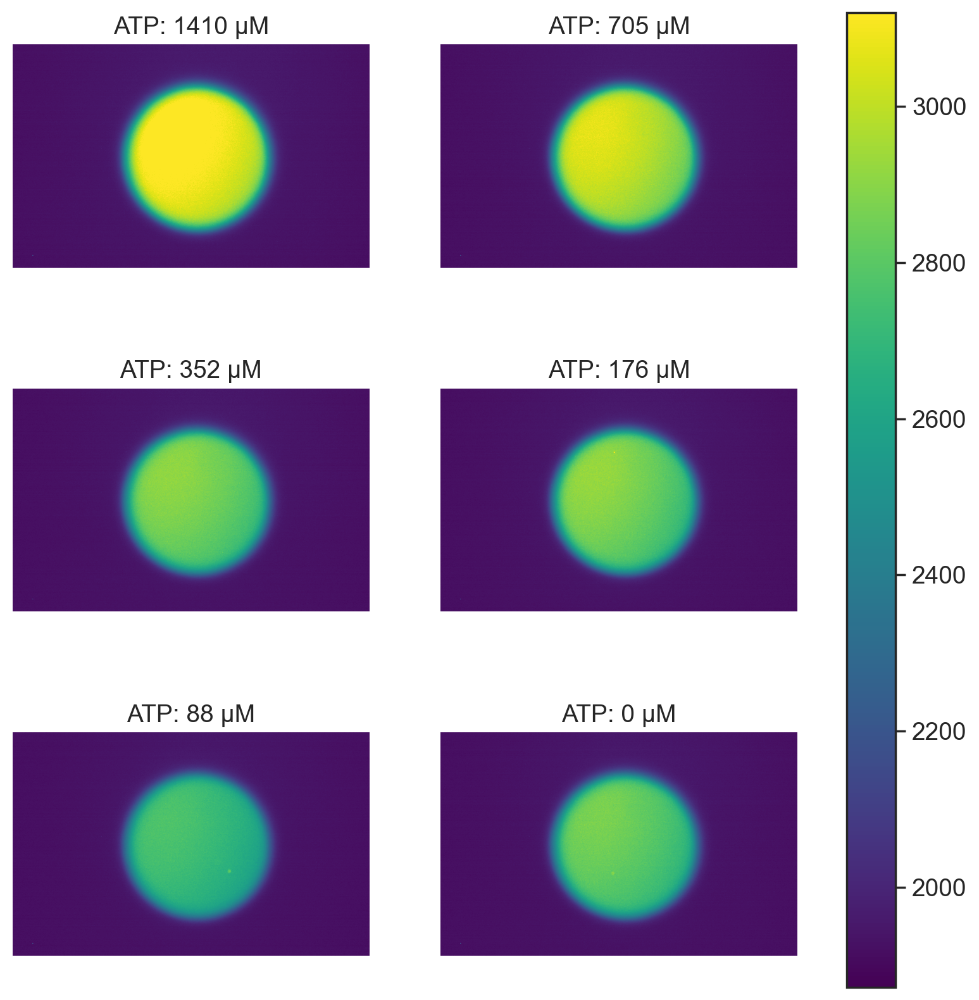

In [7]:
array_to_plot = YFP_array
colorbar_min = np.percentile(YFP_zero, 0)
colorbar_max = np.percentile(array_to_plot, 99)

#The rest is automated
if len(array_to_plot)%2 != 0:
    plot_array = np.concatenate((array_to_plot, np.zeros((1, 1200, 1920))))
    plot_ATPconc = np.concatenate((ATPconc, np.array(['filler'])))
    
else:
    plot_array = array_to_plot
    plot_ATPconc = ATPconc

fig, axes = plt.subplots(nrows=int((len(plot_array)+1)/2), ncols=2, figsize = (10, 10))

cmap=cm.get_cmap('viridis')
normalizer=Normalize(colorbar_min, colorbar_max)
im=cm.ScalarMappable(norm=normalizer)
for i,ax in enumerate(axes.flat):
    ax.imshow((plot_array[i]),cmap=cmap,norm=normalizer)
    ax.set_title('ATP: ' + str(plot_ATPconc[i]) + ' µM')
    ax.axis('off')
fig.colorbar(im, ax=axes.ravel().tolist())
plt.show()


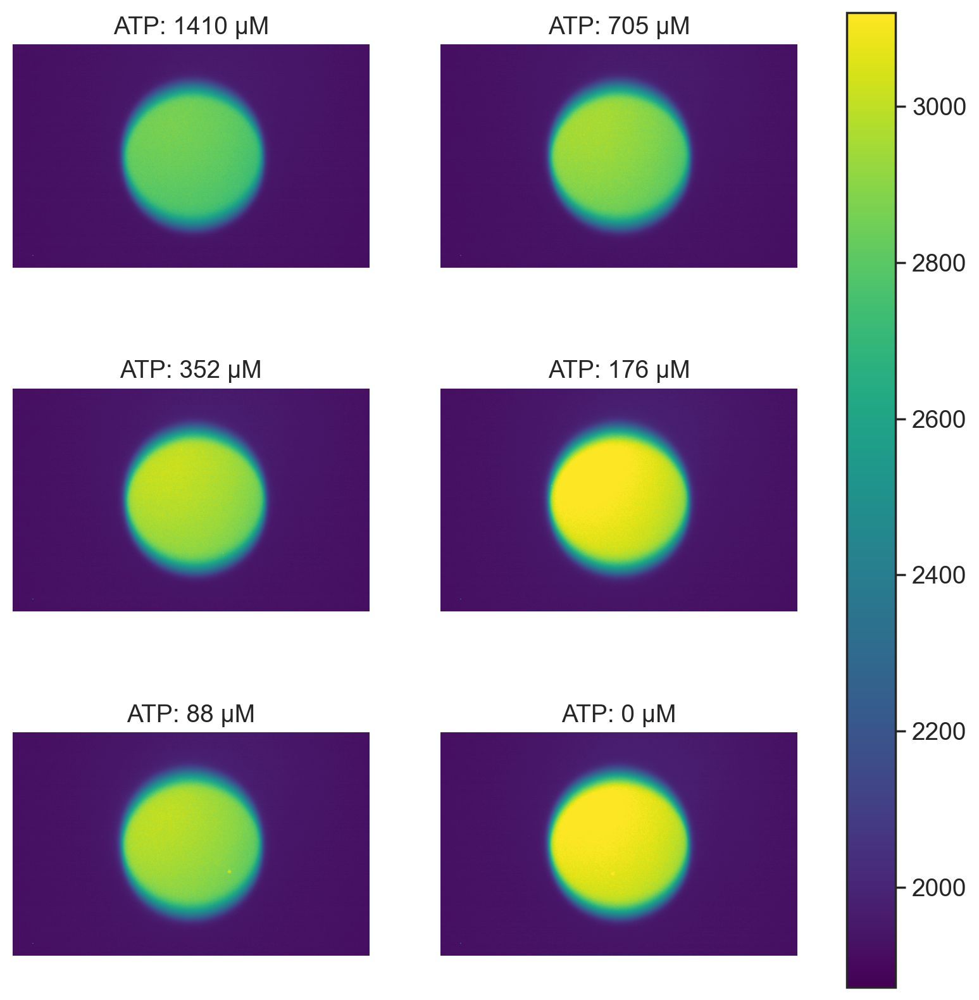

In [8]:
array_to_plot = CFP_array
colorbar_min = np.percentile(CFP_zero, 0)
colorbar_max = np.percentile(array_to_plot, 99)

#The rest is automated
if len(array_to_plot)%2 != 0:
    plot_array = np.concatenate((array_to_plot, np.zeros((1, 1200, 1920))))
    plot_ATPconc = np.concatenate((ATPconc, np.array(['filler'])))
    
else:
    plot_array = array_to_plot

fig, axes = plt.subplots(nrows=int((len(plot_array)+1)/2), ncols=2, figsize = (10, 10))

cmap=cm.get_cmap('viridis')
normalizer=Normalize(colorbar_min, colorbar_max)
im=cm.ScalarMappable(norm=normalizer)
for i,ax in enumerate(axes.flat):
    ax.imshow((plot_array[i]),cmap=cmap,norm=normalizer)
    ax.set_title('ATP: ' + str(plot_ATPconc[i]) + ' µM')
    ax.axis('off')
fig.colorbar(im, ax=axes.ravel().tolist())
plt.show()


## Subtract background and correct for uneven illumination background subtraction

In [9]:
#Subtract im_dark from all calibration images
YFP_bs = YFP_array - YFP_bg
CFP_bs = CFP_array - CFP_bg
Mot_bs = Mot_array - Mot_bg

In [10]:
CFP_bs[CFP_bs<0] = 0
YFP_bs[YFP_bs<0] = 0
Mot_bs[CFP_bs<0] = 0

## Bianary image circular mask:

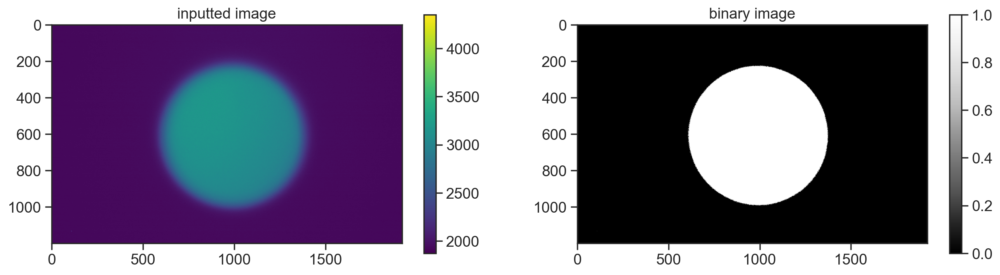

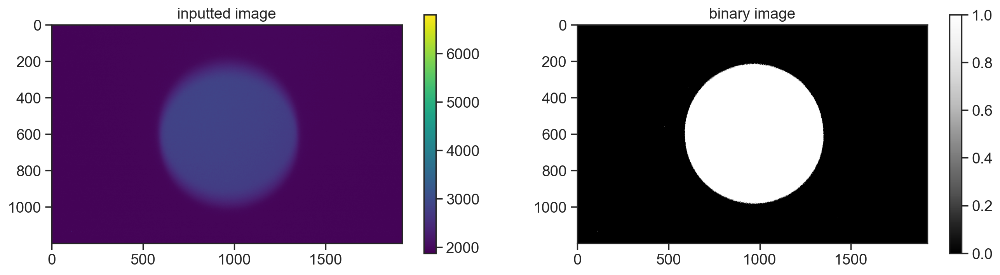

In [11]:
im_binary_YFP = atp_cal.binary_im_generator(YFP_array[0])
im_binary_CFP = atp_cal.binary_im_generator(CFP_array[0])

In [12]:
YFP_bin = YFP_bs*im_binary_YFP
CFP_bin = CFP_bs*im_binary_CFP
Mot_bin = Mot_bs*im_binary_YFP

In [13]:
# Define an average offset
YFP_bg_offset = np.average(np.nonzero(YFP_bg*im_binary_YFP))
CFP_bg_offset = np.average(np.nonzero(CFP_bg*im_binary_YFP))
Mot_bg_offset = np.average(np.nonzero(Mot_bg*im_binary_YFP))

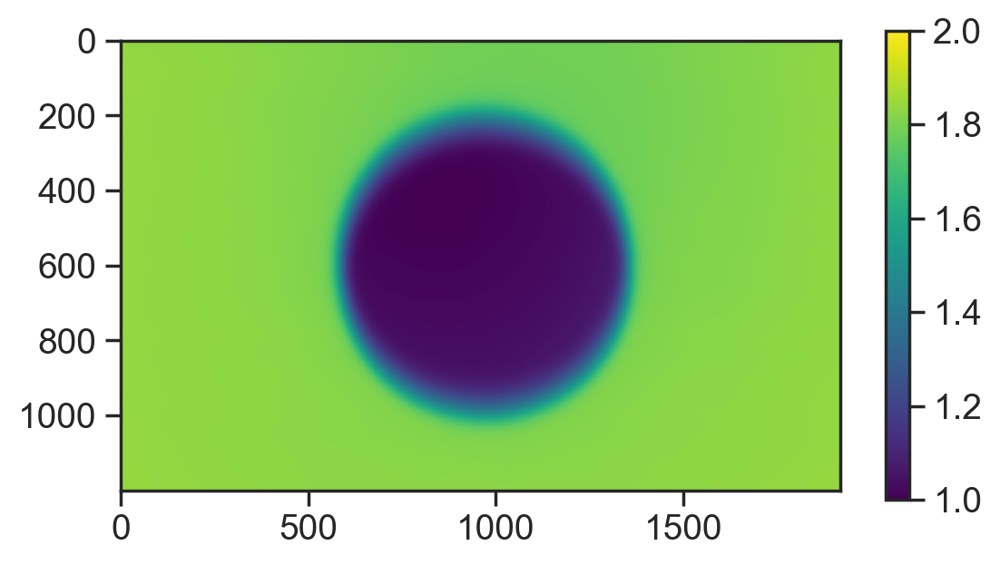

In [14]:
#Find the normilization matrix
YFP_norm_mat = atp_cal.norm_mat_fn_iATP(YFP_zero, YFP_bg_offset)
CFP_norm_mat = atp_cal.norm_mat_fn_iATP(CFP_zero, CFP_bg_offset)
Mot_norm_mat = atp_cal.norm_mat_fn_iATP(Mot_zero, Mot_bg_offset)

#plot the normalizaiton matrix
plt.imshow(CFP_norm_mat, vmin = 1, vmax = 2)
plt.colorbar(shrink = 0.7)
plt.grid(False)

In [15]:
#Normalize all the claibration images by multiplying by the normalization matrix
YFP_norm = YFP_bin*YFP_norm_mat
CFP_norm = CFP_bin*CFP_norm_mat
Mot_norm = Mot_bin*Mot_norm_mat

In [16]:
print(CFP_bs.min())
print(CFP_norm_mat.min())
print(CFP_bin.min())
print(YFP_bs.min())
print(YFP_norm_mat.min())
print(YFP_bin.min())

0
1.0000015039399637
0
0
1.0000006114753375
0


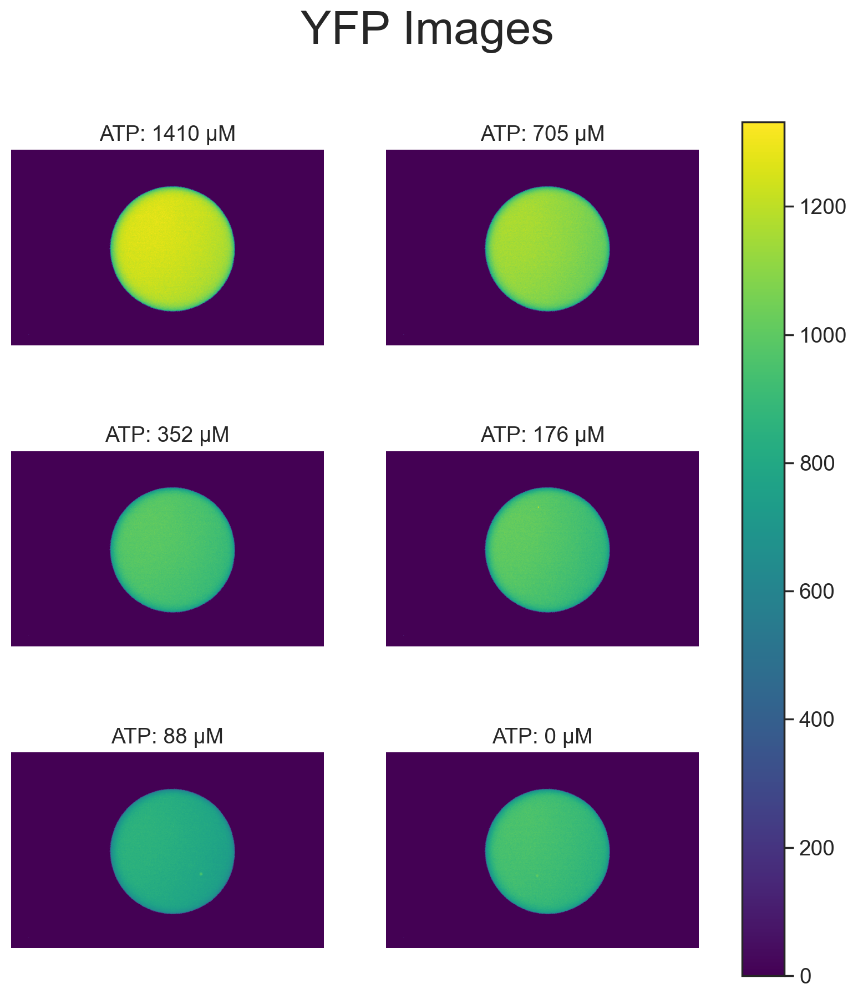

In [17]:
array_to_plot = YFP_norm
colorbar_min = np.percentile(array_to_plot, 0)
colorbar_max = np.percentile(array_to_plot, 99.99)

#Rest is automated
if len(array_to_plot)%2 != 0:
    plot_array = np.concatenate((array_to_plot, np.zeros((1, 1200, 1920))))
    plot_ATPconc = np.concatenate((ATPconc, np.array(['filler'])))
else:
    plot_array = array_to_plot

fig, axes = plt.subplots(nrows=int((len(plot_array)+1)/2), ncols=2, figsize = (10, 10))

cmap=cm.get_cmap('viridis')
normalizer=Normalize(colorbar_min, colorbar_max)
im=cm.ScalarMappable(norm=normalizer)
for i,ax in enumerate(axes.flat):
    ax.imshow((plot_array[i]),cmap=cmap,norm=normalizer)
    ax.set_title('ATP: ' + str(plot_ATPconc[i]) + ' µM')
    ax.axis('off')
plt.suptitle('YFP Images', fontsize=30)
fig.colorbar(im, ax=axes.ravel().tolist())
plt.show()

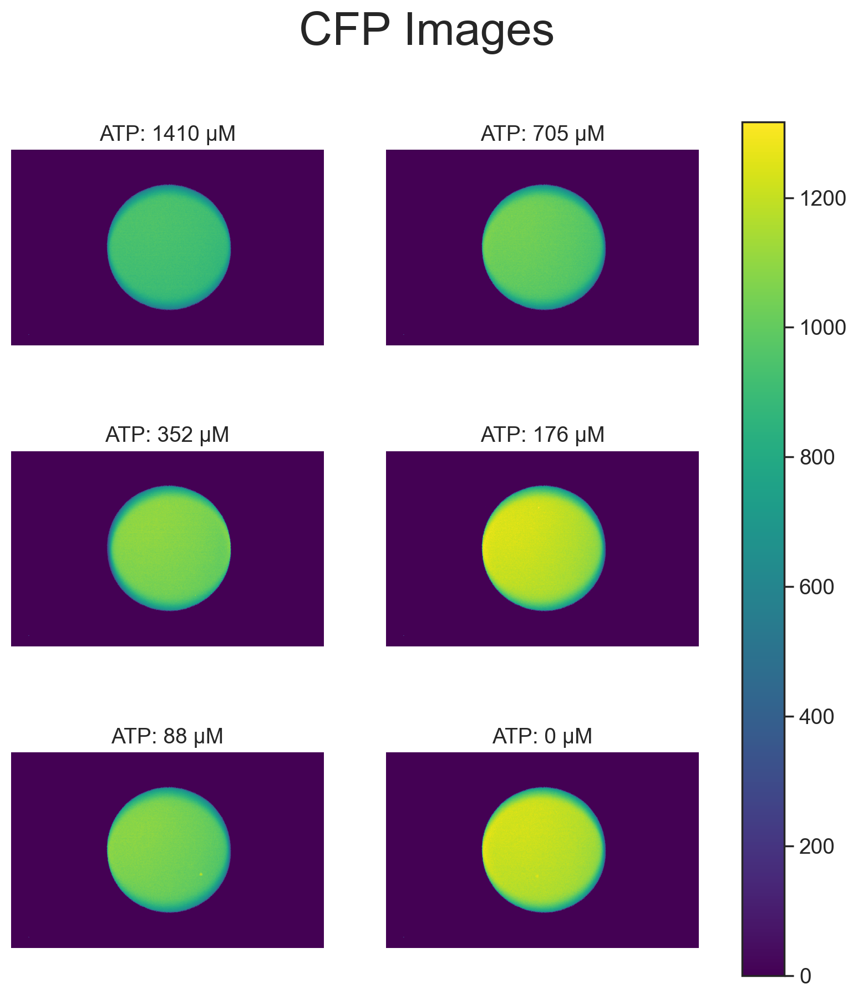

In [18]:
array_to_plot = CFP_norm
colorbar_min = np.percentile(array_to_plot, 0)
colorbar_max = np.percentile(array_to_plot, 99.99)

#Rest is automated
if len(array_to_plot)%2 != 0:
    plot_array = np.concatenate((array_to_plot, np.zeros((1, 1200, 1920))))
    plot_ATPconc = np.concatenate((ATPconc, np.array(['filler'])))
else:
    plot_array = array_to_plot

fig, axes = plt.subplots(nrows=int((len(plot_array)+1)/2), ncols=2, figsize = (10, 10))

cmap=cm.get_cmap('viridis')
normalizer=Normalize(colorbar_min, colorbar_max)
im=cm.ScalarMappable(norm=normalizer)
for i,ax in enumerate(axes.flat):
    ax.imshow((plot_array[i]),cmap=cmap,norm=normalizer)
    ax.set_title('ATP: ' + str(plot_ATPconc[i]) + ' µM')
    ax.axis('off')
    
plt.suptitle('CFP Images', fontsize=30)
fig.colorbar(im, ax=axes.ravel().tolist())
plt.show()

### Find Center

In [19]:
def center(im_array):
    centers = []

    for i, im in enumerate(tqdm(im_array)):
        #Create a binary mask for above a threshold
        thresh = threshold_otsu(im) #Otsu threshold method
        binary = (im>thresh).astype(np.uint8)
        
        
        properties = regionprops(binary, im)
        center = properties[0].centroid
        center = [round(center[0]), round(center[1])]
        centers.append(center)
        
    return centers


In [20]:
YFP_centers = center(YFP_norm)
CFP_centers = center(CFP_norm)
print('center shifts: YFP + ' + str([YFP_centers[0][0]-CFP_centers[0][0], YFP_centers[0][1]-CFP_centers[0][1]]) + ' = CFP')

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

center shifts: YFP + [9, 23] = CFP


In [21]:
radius = 385
sidelength = int(radius/np.sqrt(2))

YFP_circlecrop = []
for i, im in enumerate(tqdm(YFP_norm)):
    im_crop = im[YFP_centers[i][0] - radius : YFP_centers[i][0] + radius,
                YFP_centers[i][1] - radius : YFP_centers[i][1] + radius]
    YFP_circlecrop.append(im_crop)
    
YFP_squarecrop = []
for i, im in enumerate(tqdm(YFP_norm)):
    im_crop = im[YFP_centers[i][0] - sidelength : YFP_centers[i][0] + sidelength,
                YFP_centers[i][1] - sidelength : YFP_centers[i][1] + sidelength]
    YFP_squarecrop.append(im_crop)
    
CFP_circlecrop = []
for i, im in enumerate(tqdm(CFP_norm)):
    im_crop = im[int(CFP_centers[i][0]) - radius : int(CFP_centers[i][0]) + radius ,
                int(CFP_centers[i][1]) - radius : int(CFP_centers[i][1]) + radius]
    CFP_circlecrop.append(im_crop)

CFP_squarecrop = []
for i, im in enumerate(tqdm(CFP_norm)):
    im_crop = im[int(CFP_centers[i][0]) - sidelength : int(CFP_centers[i][0]) + sidelength ,
                int(CFP_centers[i][1]) - sidelength : int(CFP_centers[i][1]) + sidelength]
    CFP_squarecrop.append(im_crop)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/3839405452.py:3: RuntimeWarning: divide by zero encountered in true_divide
  im = (YFP_circlecrop[i]/CFP_circlecrop[i])
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/3839405452.py:3: RuntimeWarning: invalid value encountered in true_divide
  im = (YFP_circlecrop[i]/CFP_circlecrop[i])


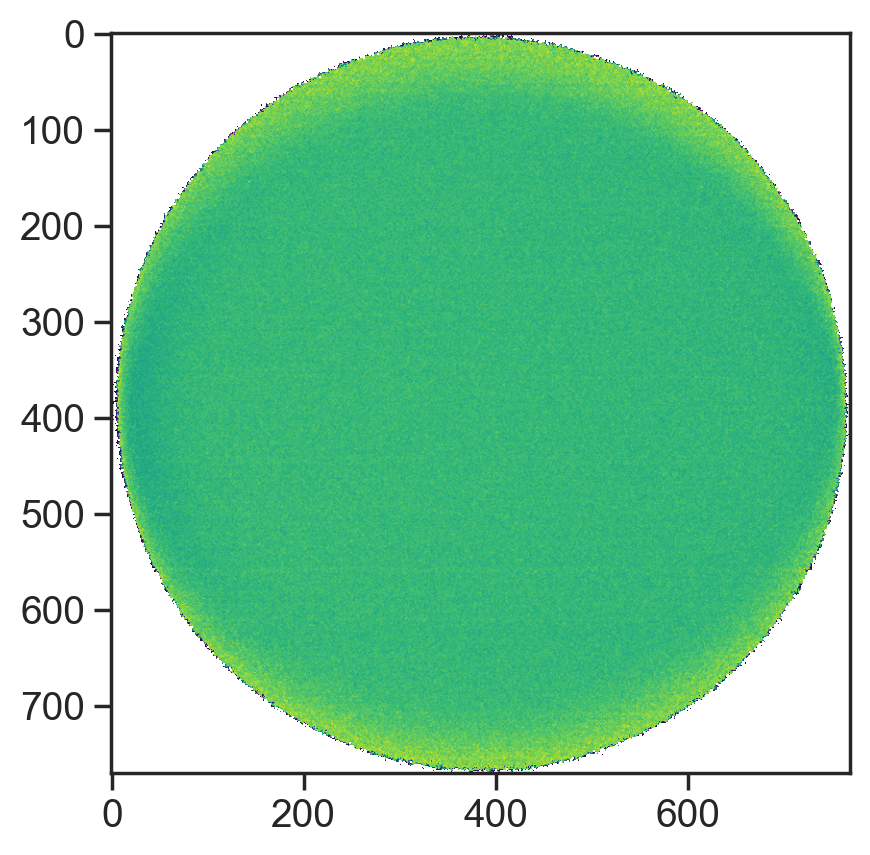

In [22]:
ratio_circlecrop =[]
for i in range(len(YFP_circlecrop)):
    im = (YFP_circlecrop[i]/CFP_circlecrop[i])
    im[np.where(im==np.inf)] = 0
    ratio_circlecrop.append(im)
ratio_circlecrop = np.array(ratio_circlecrop)
plt.imshow(ratio_circlecrop[0])

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/2739240886.py:3: RuntimeWarning: divide by zero encountered in true_divide
  im = (YFP_squarecrop[i]/CFP_squarecrop[i])
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/2739240886.py:3: RuntimeWarning: invalid value encountered in true_divide
  im = (YFP_squarecrop[i]/CFP_squarecrop[i])


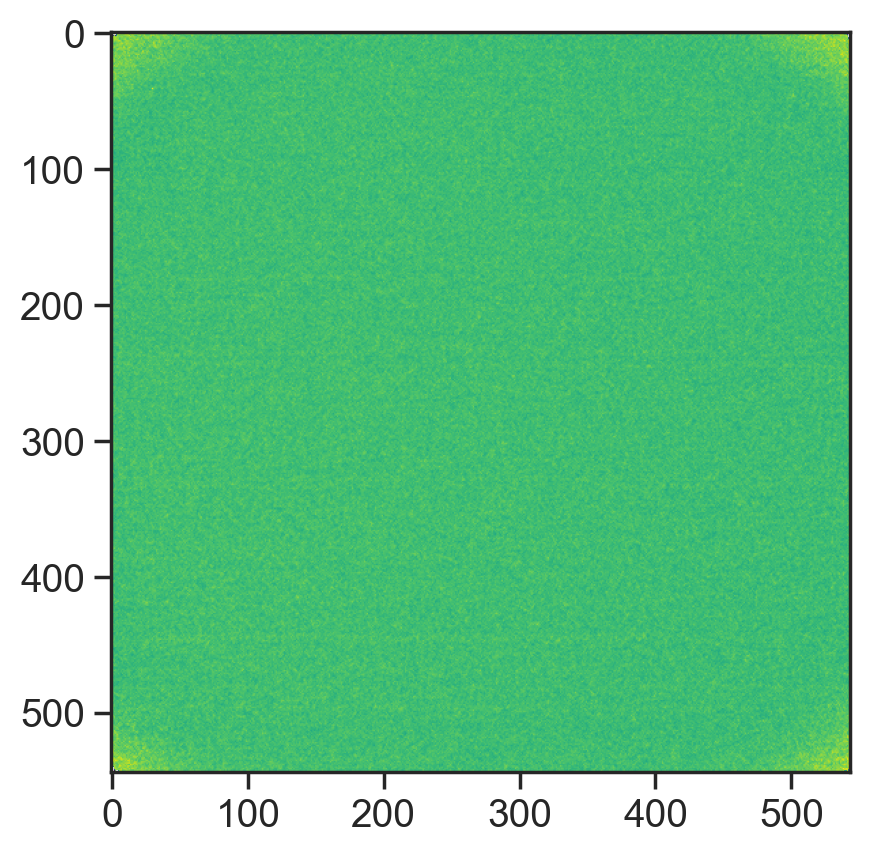

In [23]:
ratio_squarecrop =[]
for i in range(len(YFP_squarecrop)):
    im = (YFP_squarecrop[i]/CFP_squarecrop[i])
    im[np.where(im==np.inf)] = 0
    ratio_squarecrop.append(im)
ratio_squarecrop = np.array(ratio_squarecrop)
plt.imshow(ratio_squarecrop[0])

## Calculate the average intensity value per concentration
Average all images inside of the binary mask

In [24]:
#Average over the non-zero values in the image to get the calibration
YFP_calavg = np.empty(len(YFP_squarecrop))
for i, im in enumerate(YFP_squarecrop):
    YFP_calavg[i] = np.average(im[np.nonzero(im)])
    
CFP_calavg = np.empty(len(CFP_squarecrop))
for i, im in enumerate(CFP_squarecrop):
    CFP_calavg[i] = np.average(im[np.nonzero(im)])
    
#ratio_calavg = YFP_calavg/CFP_calavg

ratio_calavg = np.empty(len(YFP_squarecrop))
for i in range(len(YFP_norm)):
    im = YFP_squarecrop[i]/CFP_squarecrop[i]
    im[np.where(im==np.inf)] = 0
    ratio_calavg[i] = np.nanmean(im[np.nonzero(im)])
    
Mot_calavg = np.empty(len(Mot_norm))
for i, im in enumerate(Mot_norm):
    Mot_calavg[i] = np.average(im[np.nonzero(im)])

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/370147626.py:14: RuntimeWarning: divide by zero encountered in true_divide
  im = YFP_squarecrop[i]/CFP_squarecrop[i]
/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_59091/370147626.py:14: RuntimeWarning: invalid value encountered in true_divide
  im = YFP_squarecrop[i]/CFP_squarecrop[i]


In [25]:
print(YFP_calavg)
print(' ')
print(CFP_calavg)
print(' ')
print(ratio_calavg)
print(' ')

[1225.23258183 1112.09273196  961.37601675  964.99796366  820.51701818
  918.38520341]
 
[ 918.01241161  997.541958   1059.75695734 1183.63044658 1035.73211766
 1181.31773218]
 
[1.33673083 1.1167223  0.90879096 0.81668951 0.7936065  0.77863124]
 


## Plot the data and fit to a Hill function

In [26]:
#Langmuir equation
def ATeam_Hill(conc, a, b, c, d):
    """
    Given a concentration value, this function returns an intensity value based on the Hill function given
    in Immamura et. al (ATeam paper)
    Parameters
    conc = 1D array of concentrations
    a, b, c, d parameters of the function
    
    Returns
    A 1D array of intensities corresponding to the given concentrations
    """
    
    
    
    return (((b-c)*(conc/a)**d/(1+(conc/a)**d))+c)



#Curve-fit to the Langmuir curve
def ATeam_Hill_curve_fit(conc, calavg, maxconc, p0):
    """
    Performs a curve fitting using scipy.optimize.curve_fit to fit data to a Langmuir curve
    
    Parameters
    conc = 1D array of concentrations
    calavg = 1D array of average intensity values of data
    maxconc = scalar Maximum concentration of data taken
    p0 = 1D list with 4 entries of parameter guesses for a, b, c, and d in the Hill function
    
    Returns
    param = 1D list with fit values of each parameter
    curve = 1D array of intensity values for every concentration in xvals
    xvals = 1D array from 0 to maxconc with step size 1
    """
    
    
    #Curve fits and returns parameter values as well as the covarience
    param, param_cov = curve_fit(ATeam_Hill, 
                                 conc, 
                                 calavg, 
                                 p0, 
                                 bounds = (np.zeros(4), np.ones([4])*np.inf))

    #stores the new function information according to the coefficients given by curve-fit() function 
    xvals=np.linspace(0,maxconc,maxconc)
    curve = ATeam_Hill(xvals, param[0], param[1], param[2], param[3])
    
    return param, curve, xvals

[742.37135995   1.48886438   0.78090529   2.02088284]


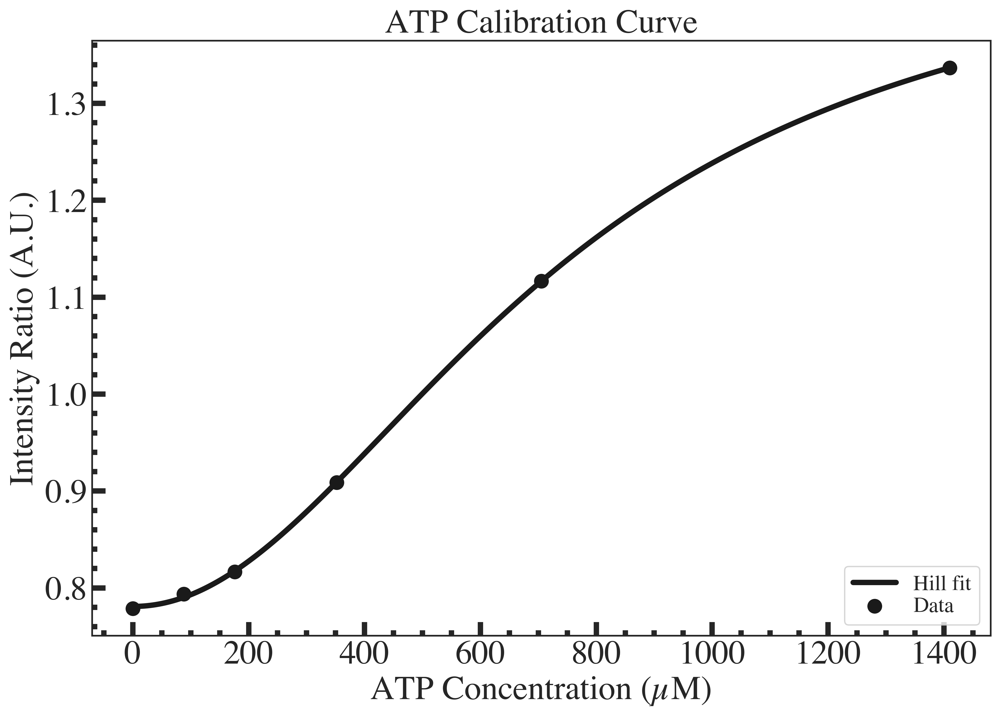

In [32]:
params, curve, xvals = ATeam_Hill_curve_fit(ATPconc[:], ratio_calavg[:], ATPconc[0], [300, 1, 0.5, 7])
print(params)

fig, axes = plt.subplots(figsize = (12,8))

plt.scatter(ATPconc[:], ratio_calavg[:], label = 'Data', s=100, color = 'k')
#plt.xscale('log')
plt.plot(xvals, curve, label='Hill fit', linewidth = 4, color = 'k')
plt.legend(loc = 'lower right', fontsize = 16)
plt.xlabel('ATP Concentration (µM)', fontsize = 25)
plt.ylabel('Intensity Ratio (A.U.)', fontsize = 25)
plt.title('ATP Calibration Curve', fontsize = 25)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.tick_params('both', labelsize =25, which='both', width =4)
#fig.savefig('2022-06-29_ATeam_Cal_1--Kd=742_Rr=1.49_Rm=0.78_n=2.02.png', transparent= True, dpi=400)

## Radial Trace - Noise Evaluation

In [56]:
r_inner = 0
r_outer = radius*0.8
print('r_inner: ' + str(r_inner*um_per_pixel) + ' µm, r_outer: ' +str(r_outer*um_per_pixel) + ' µm')

r_inner: 0.0 µm, r_outer: 89.32 µm


In [57]:
def profile_fn(im,
               r_min=2.5,
               dr=1.5,
               r_max=None,
               avg_method='median',
               n_positions=100,
               n_wedge=16):
    """
    Calculate the radial intensity profile of an image, 
    assuming that the (0,0) coordinate is at the center of the image.
    
    Parameters
    ----------
    im : numpy array
        The cropped image of the aster (grayscale).
      
    r_min : float
        Minimum radius beyond which the intensity profile is calculated [px].
    
    dr : float
        Radial binning size [px].
    
    avg_method : string
        The method used for doing a radial average of intensities.
        'median' - median averaging
        'mean' - mean averaging
        
    n_positions : integer
        Number of uniformly spaced radial positions where the average
        intensity is calculated.
        
    n_wedge : integer
        Number of angular bins
        
                      
    Returns
    -------
    profile_output : dictionary
        Dictionary of different outputs listed below
    
      r_unif_ls : numpy array
          Uniformly spaced radii where the average intensity is evaluated.
          
      avg_ls : numpy array
          Average intensities evaluated at 'n_positions' different uniformly
          spaced radii.
          
      std_ls : numpy array
          Standard deviations of intensity values in differents wedges
          
      avg_bin_mat : numpy array
          Two dimensional array to store the average fluorescence values
          at each of 'n_positions' radii and for each angular bin
          
      angles : numpy array
          List of average angles at different bins. E.g., if the upper and
          lower θ-limits are (30° and 60°), then the corresponding element
          in angles will be 45°.
          
      r_ls : numpy array
          Radial distances of all image pixels from the image center.
          
      im_ls : numpy array
          All pixel intensities in the same order as 'r_ls'.
    """

    # Ensure that the image is a numpy array
    if not isinstance(im, np.ndarray):
        im = np.array(im)

    # Dimensions of the image
    H, W = im.shape

    # Array of the radial distance of each point from the center
    x_mat, y_mat = np.meshgrid(np.arange(W), np.arange(H))
    x_center = 0.5 * W - 0.5
    y_center = 0.5 * H - 0.5
    r_mat = np.sqrt((x_mat - x_center)**2 + (y_mat - y_center)**2)
    angle_mat = np.mod(np.arctan2(y_mat - y_center, x_mat - x_center),
                       2 * np.pi)

    # Convert 2d arrays into 1d arrays
    r_ls = r_mat.flatten()
    im_ls = im.flatten()
    angle_ls = angle_mat.flatten()

    # Uniformly spaced radii, starting with r_min and
    # ending with the smallest dimension of the image halved,
    # if r_max is not explicitly specified
#     if type(r_max) != np.ndarray:
#         r_max = 0.5 * np.min([H, W]) - 0.5

    r_unif_ls = np.linspace(r_min, r_max, n_positions)

    # List of bin angles
    angle_bins = np.radians(np.linspace(0, 360, n_wedge + 1))
    angles = 0.5 * (angle_bins[1:] + angle_bins[0:-1])

    # Matrix to store average profiles in each radial bin
    avg_bin_mat = [[] for _ in range(n_wedge)]

    for i, r in enumerate(r_unif_ls):
        dat = im_ls[(r_ls > r - 0.5 * dr) & (r_ls < r + 0.5 * dr)]
        angle_disk = angle_ls[(r_ls > r - 0.5 * dr) & (r_ls < r + 0.5 * dr)]

        for k in range(n_wedge):
            dat_bin = dat[(angle_disk > angle_bins[k])
                          & (angle_disk <= angle_bins[k + 1])]

            if avg_method == 'median':
                avg_dat_bin = np.median(dat_bin)
            elif avg_method == 'mean':
                avg_dat_bin = np.mean(dat_bin)
            avg_bin_mat[k].append(avg_dat_bin)

    avg_bin_mat = np.array(avg_bin_mat)
    if avg_method == 'median':
        avg_ls = np.nanmedian(avg_bin_mat, axis=0)
    elif avg_method == 'mean':
        avg_ls = np.nanmean(avg_bin_mat, axis=0)
    else:
        raise ValueError('Incorrect averaging method specified.')

    std_ls = np.std(avg_bin_mat, axis=0)

    # Keep only the points inside the disk
    im_ls = im_ls[r_ls <= r_max]
    r_ls = r_ls[r_ls <= r_max]

    profile_output = {
        "r_unif_ls": r_unif_ls,
        "r_unif_ls_um": r_unif_ls * um_per_pixel,
        "avg_ls": avg_ls,
        "std_ls": std_ls,
        "avg_bin_mat": avg_bin_mat,
        "angles": angles,
        "r_ls": r_ls,
        "im_ls": im_ls
    }

    return profile_output

In [58]:
# getting GFP, CFP, MT, Cherry profiles averaged across radial blocks
output_YFP = []
output_CFP = []
output_ratios = []

num_pos = 100

avg_method_default = 'mean'
for i, im in enumerate(tqdm(ratio_circlecrop)):
    prof_YFP = profile_fn(YFP_circlecrop[i],
                          r_min=r_outer,
                          r_max=r_inner,
                         avg_method=avg_method_default,
                         n_positions=num_pos)
    output_YFP.append(prof_YFP)
    
    prof_CFP = profile_fn(CFP_circlecrop[i],
                          r_min=r_outer,
                          r_max=r_inner,
                         avg_method=avg_method_default,
                         n_positions=num_pos)
    output_CFP.append(prof_CFP)
    
    prof_ratios = profile_fn(im,
                          r_min=r_outer,
                          r_max=r_inner,
                         avg_method=avg_method_default,
                         n_positions=num_pos)
    output_ratios.append(prof_ratios)

  0%|          | 0/6 [00:00<?, ?it/s]

/Users/anaduarte/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/anaduarte/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


1410
705
352
176
88
0


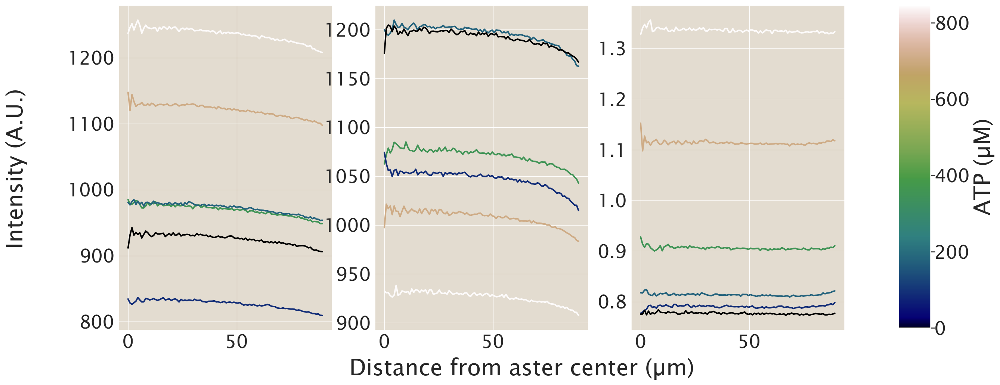

In [59]:
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# setup the normalization and the colormap
normalize = mcolors.Normalize(vmin=ATPconc.min(), vmax=0.6*ATPconc.max())
colormap = cm.gist_earth
scalarmappable = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappable.set_array(ATPconc)

for i, conc in enumerate(ATPconc):
    print(conc)

    ax[0].plot(output_YFP[i]['r_unif_ls_um'],
             output_YFP[i]['avg_ls'],
             lw=2,
             color = colormap(normalize(conc)),
             label=str(conc))

    ax[1].plot(output_CFP[i]['r_unif_ls_um'],
             output_CFP[i]['avg_ls'],
             lw=2,
             color = colormap(normalize(conc)),
             label=str(conc))
    
    ax[2].plot(output_ratios[i]['r_unif_ls_um'],
             output_ratios[i]['avg_ls'],
             lw=2,
             color = colormap(normalize(conc)),
             label=str(conc))



fig.supxlabel('Distance from aster center (µm)', fontsize=30)
fig.supylabel('Intensity (A.U.)', fontsize=30)
# ax[0].set_ylabel('Motor Concentration (µM)')
# ax[1].set_ylabel('ATP Concentration (µM)')
# ax[0].set_xlabel('Distance from aster center (µm)')
# ax[1].set_xlabel('Distance from aster center (µm)')

ax[0].tick_params('both', labelsize=25)
ax[1].tick_params('both', labelsize=25)
ax[2].tick_params('both', labelsize=25)

fig.subplots_adjust(right=0.8)
color_bar_ax = fig.add_axes([0.85, 0.13, 0.03, 0.75])
cbar = fig.colorbar(scalarmappable, cax=color_bar_ax)
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label="ATP (µM)", size=30, weight='bold')

# scalarmappable = cm.ScalarMappable(norm=normalize, cmap=colormap)
# scalarmappable.set_array(plot_times)
# cbar = plt.colorbar(scalarmappable, label = "Times (min)")

#fig.savefig('../../figures/Motor_ATP_Traces')

Text(0.5, 1.0, 'ATP = 0 (µM)')

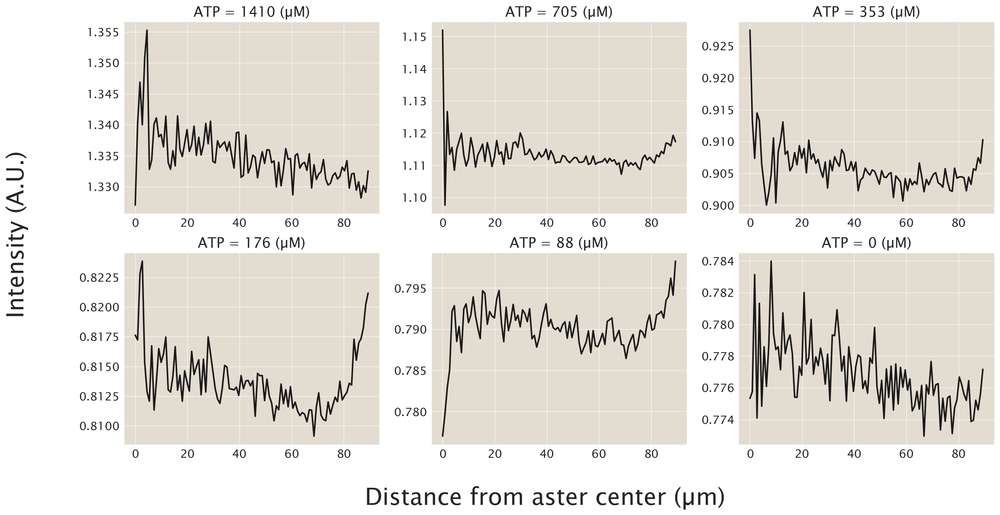

In [60]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))

ax[0][0].plot(output_ratios[0]['r_unif_ls_um'],
         output_ratios[0]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))

ax[0][1].plot(output_ratios[1]['r_unif_ls_um'],
         output_ratios[1]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))

ax[0][2].plot(output_ratios[2]['r_unif_ls_um'],
         output_ratios[2]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))

ax[1][0].plot(output_ratios[3]['r_unif_ls_um'],
         output_ratios[3]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))

ax[1][1].plot(output_ratios[4]['r_unif_ls_um'],
         output_ratios[4]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))

ax[1][2].plot(output_ratios[5]['r_unif_ls_um'],
         output_ratios[5]['avg_ls'],
         lw=2,
         color = 'k',
         label=str(conc))



fig.supxlabel('Distance from aster center (µm)', fontsize=30)
fig.supylabel('Intensity (A.U.)', fontsize=30)
# ax[0].set_ylabel('Motor Concentration (µM)')
# ax[1].set_ylabel('ATP Concentration (µM)')
# ax[0].set_xlabel('Distance from aster center (µm)')
# ax[1].set_xlabel('Distance from aster center (µm)')

ax[0][0].tick_params('both', labelsize=15)
ax[0][1].tick_params('both', labelsize=15)
ax[0][2].tick_params('both', labelsize=15)
ax[1][0].tick_params('both', labelsize=15)
ax[1][1].tick_params('both', labelsize=15)
ax[1][2].tick_params('both', labelsize=15)

ax[0][0].set_title('ATP = 1410 (µM)')
ax[0][1].set_title('ATP = 705 (µM)')
ax[0][2].set_title('ATP = 353 (µM)')
ax[1][0].set_title('ATP = 176 (µM)')
ax[1][1].set_title('ATP = 88 (µM)')
ax[1][2].set_title('ATP = 0 (µM)')

#fig.savefig('../../figures/Motor_ATP_Traces')

### Add in a crop so that edge effects dont matter

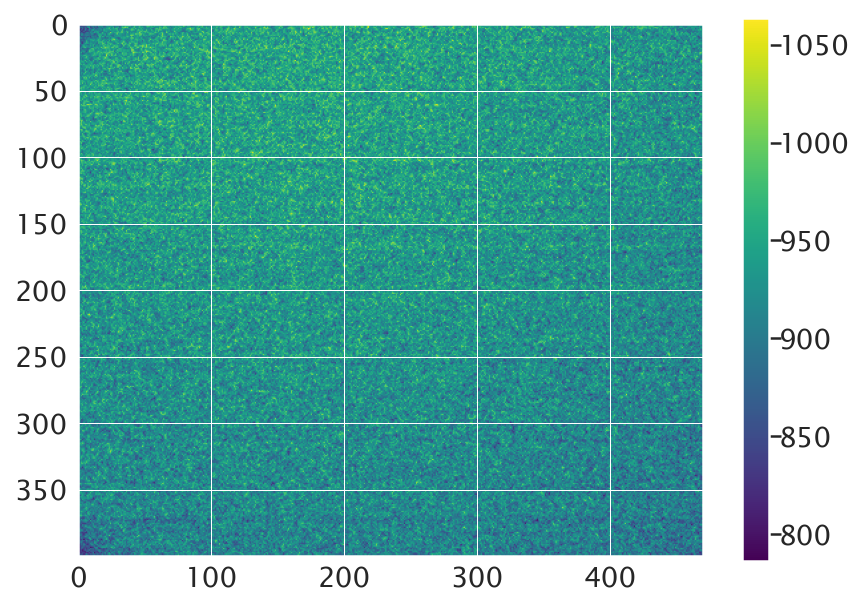

In [23]:
plt.imshow(CFP_norm[0] [400:800, 680:1150])#[400:800, 760:1160])
plt.colorbar()

In [24]:
crop = np.s_[400:800, 680:1150]

In [25]:
for i in range(len(YFP_norm)):
    im = YFP_norm[i][crop]/CFP_norm[i][crop]
    im[np.where(im==np.inf)] = 0
    mintest = round(np.min(im),2)
    maxtest = round(np.max(im),2)
    meantest = round(np.nanmean(im[np.nonzero(im)]),2)
    print('min: ' + str(mintest) + '   max: ' + str(maxtest) + '   mean: ' + str(meantest))
                                                                                                         

min: 1.01   max: 1.6   mean: 1.34
min: 0.81   max: 1.35   mean: 1.12
min: 0.75   max: 1.08   mean: 0.91
min: 0.59   max: 0.96   mean: 0.82
min: 0.58   max: 0.99   mean: 0.79
min: 0.57   max: 0.93   mean: 0.78


## Calculate the average intensity value per concentration

In [26]:
#Average over the non-zero values in the image to get the calibration
YFP_calavg = np.empty(len(YFP_norm))
for i, im in enumerate(YFP_norm):
    im = im[crop]
    YFP_calavg[i] = np.average(im[np.nonzero(im)])
    
CFP_calavg = np.empty(len(CFP_norm))
for i, im in enumerate(CFP_norm):
    im = im[crop]
    CFP_calavg[i] = np.average(im[np.nonzero(im)])
    
#ratio_calavg = YFP_calavg/CFP_calavg

ratio_calavg = np.empty(len(YFP_norm))
for i in range(len(YFP_norm)):
    im = YFP_norm[i][crop]/CFP_norm[i][crop]
    im[np.where(im==np.inf)] = 0
    ratio_calavg[i] = np.nanmean(im[np.nonzero(im)])
    
Mot_calavg = np.empty(len(Mot_norm))
for i, im in enumerate(Mot_norm):
    Mot_calavg[i] = np.average(im[np.nonzero(im)])

In [27]:
print(YFP_calavg)
print(' ')
print(CFP_calavg)
print(' ')
print(ratio_calavg)
print(' ')

[1239.74936462 1130.38367085  974.56435118  982.89525986  834.94176644
  931.4640091 ]
 
[ 928.90747369 1013.58214218 1073.94871224 1204.54392654 1054.28146406
 1197.90647428]
 
[1.33597083 1.11623582 0.90822845 0.81658809 0.7926442  0.77816898]
 


## Plot the data and fit to a Hill function

In [28]:
#Langmuir equation
def ATeam_Hill(conc, a, b, c, d):
    """
    Given a concentration value, this function returns an intensity value based on the Hill function given
    in Immamura et. al (ATeam paper)
    Parameters
    conc = 1D array of concentrations
    a, b, c, d parameters of the function
    
    Returns
    A 1D array of intensities corresponding to the given concentrations
    """
    
    
    
    return (((b-c)*(conc/a)**d/(1+(conc/a)**d))+c)



#Curve-fit to the Langmuir curve
def ATeam_Hill_curve_fit(conc, calavg, maxconc, p0):
    """
    Performs a curve fitting using scipy.optimize.curve_fit to fit data to a Langmuir curve
    
    Parameters
    conc = 1D array of concentrations
    calavg = 1D array of average intensity values of data
    maxconc = scalar Maximum concentration of data taken
    p0 = 1D list with 4 entries of parameter guesses for a, b, c, and d in the Hill function
    
    Returns
    param = 1D list with fit values of each parameter
    curve = 1D array of intensity values for every concentration in xvals
    xvals = 1D array from 0 to maxconc with step size 1
    """
    
    
    #Curve fits and returns parameter values as well as the covarience
    param, param_cov = curve_fit(ATeam_Hill, 
                                 conc, 
                                 calavg, 
                                 p0, 
                                 bounds = (np.zeros(4), np.ones([4])*np.inf))

    #stores the new function information according to the coefficients given by curve-fit() function 
    xvals=np.linspace(0,maxconc,maxconc)
    curve = ATeam_Hill(xvals, param[0], param[1], param[2], param[3])
    
    return param, curve, xvals

[742.24603069   1.48823752   0.78030014   2.0186934 ]


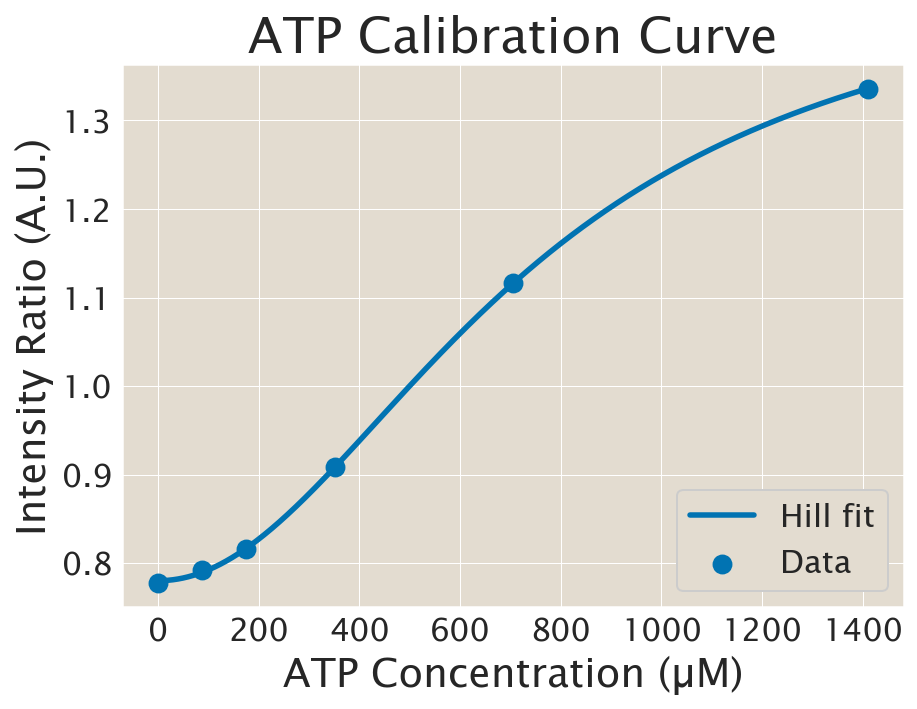

In [29]:
params, curve, xvals = ATeam_Hill_curve_fit(ATPconc[:], ratio_calavg[:], ATPconc[0], [300, 1, 0.5, 7])
print(params)

fig, axes = plt.subplots()

plt.scatter(ATPconc[:], ratio_calavg[:], label = 'Data', s=80)
#plt.xscale('log')
plt.plot(xvals, curve, label='Hill fit', linewidth = 2.75)
plt.legend(loc = 'lower right', fontsize = 16)
plt.xlabel('ATP Concentration (µM)', fontsize = 20)
plt.ylabel('Intensity Ratio (A.U.)', fontsize = 20)
plt.title('ATP Calibration Curve', fontsize = 25)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
fig.savefig('2022-06-29_ATeam_Cal_1--Kd=742_Rr=1.49_Rm=0.78_n=2.02.png', dpi=300)